# Cross-species integration - 4-species eye tissue

**Dataset:** van Zyl et al. 2020 (PNAS), aqueous humor outflow pathways.
**Species:** Human, Macaque fascicularis, Mouse, Pig.

**Method:** Mouse-like tagging: a common gene set was
built explicitly via 1-to-1 ortholog tables (`one2one_orthologs/`), remapped genes 
to mouse gene symbols, then tagged `NCBITaxon:10090` and run through the
standard `Preprocessor` (`min_valid_genes_id` lowered to 500).

**Metric:** Cell Type classification + scIB scores (`scprint_emb_cell_type_ontology_term_id`,
`X_pca`)

In [1]:
! lamin connect jkobject/scprint2

/bin/bash: lamin: command not found


In [1]:
import scanpy as sc
from scprint2 import scPRINT2
from scdataloader import Preprocessor
from scdataloader.utils import load_genes
import numpy as np
import anndata as ad
from huggingface_hub import hf_hub_download
import lamindb as ln

from scprint2.tasks import Embedder
from scprint2.tasks.cell_emb import display_confusion_matrix
import pandas as pd

from scib_metrics.benchmark import Benchmarker, BioConservation, BatchCorrection
from anndata import AnnData
from scdataloader.utils import translate
import bionty as bt
from scprint2.tasks.cell_emb import compute_classification
from scdataloader.utils import revert_to_raw

import bionty as bt
import lamindb as ln

%load_ext autoreload
%autoreload 2

import torch
import scipy.sparse
import os
import urllib.request

torch.set_float32_matmul_precision("medium")

PATH = "/pasteur/appa/scratch/jkalfon/"

→ connected lamindb: jkobject/scprint2


## Downlaod and process the data

### Download

In [ ]:
!curl "https://singlecell.broadinstitute.org/single_cell/api/v1/bulk_download/generate_curl_config?accessions=SCP780&auth_code=x2MMqKtx&directory=all&context=study" -o cfg.txt
!curl -K cfg.txt
!rm cfg.txt

In [2]:
PATH_DATA = "/pasteur/appa/scratch/jkalfon/data/PNAS_datasets/"

### Process all the data

In [3]:
def get_organism(name):
    prefix = name.split("_")[0]
    if prefix.startswith("H"):
        return "human"
    elif prefix.startswith("Maca"):
        return "macaque_fascicularis"
    elif prefix.startswith("MM"):
        return "macaque_mulatta"
    elif prefix.startswith("Mouse"):
        return "mouse"
    elif prefix.startswith("Pig"):
        return "pig"
    return "unknown"

In [4]:
import pandas as pd
meta = pd.read_csv(PATH_DATA + "metadata/all_five_species_metafile.csv")
meta = meta[meta["NAME"] != "TYPE"].reset_index(drop=True)  

meta["batch"] = meta["NAME"].apply(get_organism)
meta["donor"] = meta["NAME"].str.split("_").str[0]

print(meta.shape)
print(meta.columns.tolist())
print(meta.head())

meta_indexed = meta.set_index("NAME")

(50112, 4)
['NAME', 'Cluster', 'batch', 'donor']
                        NAME          Cluster  batch   donor
0  H1TMS1_AAACCTGAGCGTTCCG-1       Macrophage  human  H1TMS1
1  H1TMS1_AAACCTGAGGTAGCTG-1  SchwannCell-nmy  human  H1TMS1
2  H1TMS1_AAACCTGAGTTGTAGA-1         Pericyte  human  H1TMS1
3  H1TMS1_AAACCTGCAGCTGTAT-1  SchwannCell-nmy  human  H1TMS1
4  H1TMS1_AAACCTGCAGGAATCG-1        BeamCella  human  H1TMS1


In [5]:
def load_and_merge(species_prefix, meta_indexed, filename=None, name_fix=None):
    fname = filename or f"{species_prefix}_gene_expression_matrix.csv"
    expr = pd.read_csv(PATH_DATA + f"expression/{fname}", sep="\t", index_col=0)
    adata = ad.AnnData(
        X=scipy.sparse.csr_matrix(expr.T.values),
        obs=pd.DataFrame(index=expr.columns),
        var=pd.DataFrame(index=expr.index),
    )
    if name_fix is not None:
        adata.obs.index = [name_fix(i) for i in adata.obs.index]
    adata.obs = adata.obs.join(meta_indexed[["Cluster", "batch", "donor"]])
    adata.obs = adata.obs.rename(columns={"Cluster": "cell_type"})
    print(f"{species_prefix}: {adata.shape}, NaN cell_type: {adata.obs['cell_type'].isna().sum()}")
    return adata

# fix spécifique Pig
def fix_pig_name(name):
    return name.replace("Pig6TMRimS1_", "Pig6_").replace("PigTM9_", "Pig9_")
    
adata_human = load_and_merge("Human", meta_indexed)
adata_mf = load_and_merge("MacaqueF", meta_indexed)
adata_mm = load_and_merge("MacaqueM", meta_indexed)
adata_mouse = load_and_merge("Mouse", meta_indexed)
adata_pig = load_and_merge("Pig", meta_indexed, filename="Pig_expression_matrix.csv", name_fix=fix_pig_name)

Human: (24023, 21882), NaN cell_type: 0
MacaqueF: (9155, 19681), NaN cell_type: 0
MacaqueM: (5158, 14544), NaN cell_type: 0
Mouse: (5067, 17868), NaN cell_type: 0
Pig: (6709, 16068), NaN cell_type: 0


In [6]:
print(adata_human)
print(adata_mf)
print(adata_mouse)
print(adata_pig)

AnnData object with n_obs × n_vars = 24023 × 21882
    obs: 'cell_type', 'batch', 'donor'
AnnData object with n_obs × n_vars = 9155 × 19681
    obs: 'cell_type', 'batch', 'donor'
AnnData object with n_obs × n_vars = 5067 × 17868
    obs: 'cell_type', 'batch', 'donor'
AnnData object with n_obs × n_vars = 6709 × 16068
    obs: 'cell_type', 'batch', 'donor'


In [7]:
print("-------- Cell type of each dataset --------")
for name, adata in [("Human", adata_human), ("Macaque F.", adata_mf), ("Mouse", adata_mouse), ("Pig", adata_pig)]:
    print(f"--- {name} ({adata.obs['cell_type'].nunique()} types) ---")
    print(adata.obs['cell_type'].value_counts())
    print()

-------- Cell type of each dataset --------
--- Human (19 types) ---
cell_type
CiliaryMuscle          8639
SchwannCell-nmy        5004
BeamCella              3006
Macrophage             1389
BeamCellb              1358
Melanocyte             1273
CornealEpi              710
CribiformJCT            694
Fibroblast              381
NKT                     355
Pericyte                318
VascularEndo            305
MastCell                128
BCell                   119
ScEndo                  106
SchwalbeLine             97
SchwannCell-my           83
CollectorChnlAqVein      37
Neuron                   21
Name: count, dtype: int64

--- Macaque F. (20 types) ---
cell_type
1_Corneal epithelium     3992
2_BeamA                  1596
3_Macrophage              840
4_Ciliary muscle          811
5_Schwann cell            299
6_JCT                     270
7_Fibroblast              238
8_Melanocyte              221
9_Corneal epithelium      146
10_NK/T cell              132
11_Vascular           

In [8]:
print("-------- Gene format of each dataset --------")
for name, adata in [("Human", adata_human), ("Macaque F.", adata_mf), ("Mouse", adata_mouse), ("Pig", adata_pig)]:
    print(f"--- {name} ---")
    print(sorted(adata.var.index)[:20])
    print()

-------- Gene format of each dataset --------
--- Human ---
['A1BG', 'A1BG-AS1', 'A2M', 'A2M-AS1', 'A2ML1', 'A4GALT', 'AAAS', 'AACS', 'AADACL2', 'AADAT', 'AAED1', 'AAGAB', 'AAK1', 'AAMDC', 'AAMP', 'AANAT', 'AAR2', 'AARD', 'AARS', 'AARS2']

--- Macaque F. ---
['A2ML1', 'A4GALT', 'AAAS', 'AACS', 'AADAT', 'AAED1', 'AAGAB', 'AAK1_n', 'AAK1_p', 'AAMDC', 'AAMP', 'AANAT', 'AAR2', 'AARD', 'AARS', 'AARS2', 'AARSD1', 'AASDH', 'AASDHPPT', 'AASS']

--- Mouse ---
['0610005C13Rik', '0610009B22Rik', '0610009O20Rik', '0610010F05Rik', '0610010K14Rik', '0610012G03Rik', '0610030E20Rik', '0610031O16Rik', '0610033M10Rik', '0610037L13Rik', '0610038B21Rik', '0610039K10Rik', '0610040B10Rik', '0610040F04Rik', '0610040J01Rik', '0610043K17Rik', '1010001B22Rik', '1110002E22Rik', '1110002J07Rik', '1110002L01Rik']

--- Pig ---
['A1BG', 'A1CF', 'A2M', 'A4GALT', 'AAAS', 'AACS', 'AADACL2', 'AAGAB', 'AAK1', 'AAMP', 'AAR2', 'AARD', 'AARS2', 'AASDH', 'AASDHPPT', 'AASS', 'AATF', 'ABAT', 'ABCA1', 'ABCA12']



Mouse uses MGI/RIKEN-style symbols, while Human/Macaque/Pig share HGNC-style naming:

# Load the model


In [2]:
LOC2 = "/pasteur/appa/scratch/jkalfon/models/"  
ckpt_path = os.path.join(LOC2, "small-v2.ckpt")

if not os.path.exists(ckpt_path):
    url = (
        "https://huggingface.co/jkobject/scPRINT/resolve/main/other_ckpts/small-v2.ckpt"
    )
    urllib.request.urlretrieve(url, ckpt_path)

model = scPRINT2.load_from_checkpoint(
    ckpt_path, precpt_gene_emb=None, gene_pos_file=None
)
if not torch.cuda.is_available():
    model = model.to(torch.float32)

model = model.to("cuda" if torch.cuda.is_available() else "cpu")
missing = set(model.genes) - set(load_genes(model.organisms).index)
if len(missing) > 0:
    print(
        "Warning: some genes missmatch exist between model and ontology: solving...",
    )
    model._rm_genes(missing)

model

FYI: scPRINT2 is not attached to a `Trainer`.


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scdataloader/utils.py:429: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  organismdf = pd.concat(organismdf)


scPRINT2(
  (gene_encoder): Sequential(
    (0): GeneEncoder(
      (embeddings): Embedding(335182, 256)
    )
    (1): Linear(in_features=256, out_features=256, bias=True)
    (2): ReLU()
    (3): Linear(in_features=256, out_features=256, bias=True)
  )
  (expr_encoder): EasyExprGNN(
    (neighbors_layers): ModuleList(
      (0): Linear(in_features=2, out_features=256, bias=True)
      (1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      (2): ReLU()
      (3): Dropout(p=0.02, inplace=False)
      (4): Linear(in_features=256, out_features=256, bias=True)
    )
    (self_layers): ModuleList(
      (0): Linear(in_features=1, out_features=256, bias=True)
      (1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      (2): ReLU()
      (3): Dropout(p=0.02, inplace=False)
      (4): Linear(in_features=256, out_features=256, bias=True)
    )
    (shared_layers): ModuleList(
      (0): Linear(in_features=512, out_features=256, bias=True)
    )
  )
  (class_encoder): Categor

In [3]:
# optional, to see how this is changing the results
model.mask_zeros = False  # True

## Load the 4 species datasets

## Making them look like mouse

Human, Macaque, and Pig already share compatible HGNC-style gene naming
(direct overlap ~10-12k genes), but Mouse does not (MGI/RIKEN-style symbols).
We explicitly convert every species to mouse gene symbols via 1-to-1
ortholog tables, using Mouse as the pivot (`mouse_to_MF`, `mouse_to_pig`), etc.)

In [11]:
ORTHO_DIR = "/pasteur/appa/scratch/jkalfon/data/normalize_log/one2one_orthologs" 
h2mouse_1 = pd.read_csv(f"{ORTHO_DIR}/human_to_mouse_mm10.csv")
h2mouse_2 = pd.read_csv(f"{ORTHO_DIR}/human_mouse.csv")

h2mouse_combined = pd.concat([
    h2mouse_1[["human_gene", "mouse_gene"]],
    h2mouse_2[["human_gene", "mouse_gene"]]
]).drop_duplicates()

print(f"Total pairs human->mouse: {len(h2mouse_combined)}")

def remap_to_mouse(adata, gene_col, ortho_df):
    mapping = dict(zip(ortho_df[gene_col], ortho_df["mouse_gene"]))
    valid = [g for g in adata.var.index if g in mapping]
    sub = adata[:, valid].copy()
    sub.var.index = [mapping[g] for g in sub.var.index]
    sub.var_names_make_unique()
    return sub

human_mouse = remap_to_mouse(adata_human, "human_gene", h2mouse_combined) 
macaque_f_mouse = remap_to_mouse(adata_mf, "MF_gene", pd.read_csv(f"{ORTHO_DIR}/mouse_to_MF.csv"))
pig_mouse = remap_to_mouse(adata_pig, "pig_gene", pd.read_csv(f"{ORTHO_DIR}/mouse_to_pig.csv"))
# macaque_m_mouse = remap_to_mouse(adata_mm, "MM_gene", pd.read_csv(f"{ORTHO_DIR}/mouse_to_MM.csv"))

common = set(human_mouse.var.index) & set(macaque_f_mouse.var.index) & set(pig_mouse.var.index) & set(adata_mouse.var.index) # & set(macaque_m_mouse.var.index)
print("Gene in common:", len(common))

Total pairs human->mouse: 5615
Gene in common: 1232


In [12]:
print(human_mouse)
print(macaque_f_mouse)
print(pig_mouse)

AnnData object with n_obs × n_vars = 24023 × 4465
    obs: 'cell_type', 'batch', 'donor'
AnnData object with n_obs × n_vars = 9155 × 3681
    obs: 'cell_type', 'batch', 'donor'
AnnData object with n_obs × n_vars = 6709 × 3493
    obs: 'cell_type', 'batch', 'donor'


In [13]:
da = sc.concat(
    [
        adata_mouse,
        human_mouse,
        macaque_f_mouse,
        pig_mouse
    ]
)
da.obs = da.obs.reset_index(drop=True)
da

AnnData object with n_obs × n_vars = 44954 × 1232
    obs: 'cell_type', 'batch', 'donor'

In [14]:
da.X = da.X.toarray()  # dense temporairement
da = revert_to_raw(da)
da.X = scipy.sparse.csr_matrix(da.X)  # re-sparsifier après
da.obs["organism_ontology_term_id"] = "NCBITaxon:10090"

In [15]:
preprocessor = Preprocessor(
    is_symbol=True,
    force_preprocess=True,
    skip_validate=True,
    do_postp=True,
    min_valid_genes_id=500, 
)
da = preprocessor(da.copy())

Dropping layers:  KeysView(Layers with keys: )
checking raw counts
removed 0 non primary cells, 44954 renamining
filtered out 19956 cells, 24998 renamining
Removed 4 genes not known to the ontology
Removed 0 duplicate genes
Added 55838 genes in the ontology but not present in the dataset
starting QC
Seeing 1558 outliers (6.23% of total dataset):
normalize
starting PCA


done
AnnData object with n_obs × n_vars = 24998 × 57066
    obs: 'cell_type', 'batch', 'donor', 'organism_ontology_term_id', 'nnz', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'batches'
    var: 'uid', 'symbol', 'biotype', 'is_locked', 'branch_id', 'organism_id', 'mt', 'ribo', 'hb', 'organism', 'ensembl_gene_id', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'unseen_genes'
    obsm: 'X_pca'
    layers: 'norm'


In [16]:
da

AnnData object with n_obs × n_vars = 24998 × 57066
    obs: 'cell_type', 'batch', 'donor', 'organism_ontology_term_id', 'nnz', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'batches'
    var: 'uid', 'symbol', 'biotype', 'is_locked', 'branch_id', 'organism_id', 'mt', 'ribo', 'hb', 'organism', 'ensembl_gene_id', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'unseen_genes'
    obsm: 'X_pca'
    layers: 'norm'

# Cleanup

Standardize cell type labels to Cell Ontology (CL) terms.

In [17]:
import re 

def clean_cell_type(name):
    name = re.sub(r"^\d+_", "", str(name))
    return name.strip()

In [18]:
da.obs["cell_type_clean"] = da.obs["cell_type"].apply(clean_cell_type)
print(da.obs["cell_type_clean"].value_counts())

cell_type_clean
CiliaryMuscle                      6642
Corneal epithelium                 5959
Uveal                              2081
BeamCella                          1516
Beam A                             1304
BeamCellb                          1179
Melanocyte                         1104
Macrophage                         1051
JCT                                 836
CribiformJCT                        551
SchwannCell-nmy                     477
Fibroblast                          357
CornealEpi                          267
Pigmented ciliary epithelium        264
Pericyte                            194
VascularEndo                        186
Ciliary muscle                      156
Collector channel                    87
Corneal endothelium                  84
SchwalbeLine                         83
Nonpigmented ciliary epithelium      72
Beam Y                               66
SChlemm's Canal                      63
BeamA                                58
BCell                   

Look for each cell type its CL ID:

In [19]:
res = bt.CellType.standardize(
    da.obs.cell_type_clean.value_counts().keys(),  # ta version nettoyée, sans préfixe numérique
    return_mapper=True,
    return_field="ontology_id",
)

Look cell type Bionty didn't find its CL ID:

In [20]:
manual_types = set(da.obs["cell_type_clean"]) - set(res.keys())
manual_types

{'BCell',
 'Beam A',
 'Beam X',
 'Beam Y',
 'BeamA',
 'BeamCella',
 'BeamCellb',
 'Ciliary muscle',
 'CiliaryMuscle',
 'Collector channel',
 'CollectorChnlAqVein',
 'Corneal',
 'Corneal endothelium',
 'Corneal epithelium',
 'CornealEpi',
 'CribiformJCT',
 'JCT',
 'MastCell',
 'Myoepithelium',
 'NK/T cell',
 'NKT',
 'Nonmyelinating schwann cell',
 'Nonpigmented ciliary epithelium',
 'Pigmented ciliary epithelium',
 'Pigmented epithelium',
 "SChlemm's Canal",
 'ScEndo',
 'SchwalbeLine',
 'SchwannCell-my',
 'SchwannCell-nmy',
 'Uveal',
 'Vascular',
 'Vascular Endothelium',
 'VascularEndo'}

Manual mapping for terms not resolved automatically:

In [21]:
mask = da.obs["cell_type_clean"].isin(manual_types)
print(f"Total: {mask.sum()} / {da.shape[0]} cellules ({100*mask.mean():.1f}%)")

Total: 22257 / 24998 cellules (89.0%)


In [22]:
unresolved = [
    "Collector channel", "SchwalbeLine", "CollectorChnlAqVein",
]

mask_unresolved = da.obs["cell_type_clean"].isin(unresolved)
n_unresolved = mask_unresolved.sum()
pct_unresolved = mask_unresolved.mean() * 100

print(f"Cellules sans CL ID trouvé: {n_unresolved} / {da.shape[0]} ({pct_unresolved:.1f}%)")
print()
print(da.obs.loc[mask_unresolved, "cell_type_clean"].value_counts()) 

Cellules sans CL ID trouvé: 173 / 24998 (0.7%)

cell_type_clean
Collector channel      87
SchwalbeLine           83
CollectorChnlAqVein     3
Name: count, dtype: int64


In [23]:
to_exclude = ["Collector channel", "SchwalbeLine", "CollectorChnlAqVein"]
da = da[~da.obs["cell_type_clean"].isin(to_exclude)].copy()
print(da.shape)
print(f"Avant: {da.obs['cell_type_clean'].isin(to_exclude).sum()} cellules à retirer")

(24825, 57066)
Avant: 0 cellules à retirer


In [24]:
additional = {'BCell': "CL:0000236",
 'Beam A': "CL:7770003",
 'Beam X': "CL:7770005", # Beam cell
 'Beam Y': "CL:7770005",# Beam cell
 'BeamA': "CL:7770003",
 'BeamCella': "CL:7770003",
 'BeamCellb': "CL:7770006",
 'Ciliary muscle': "CL:1000443",
 'CiliaryMuscle': "CL:1000443",
 'Corneal': "CL:0000132", # = corneal endothelial cell
 'Corneal endothelium': "CL:0000132",
 'Corneal epithelium': "CL:0000575",
 'CornealEpi': "CL:0000575",
 'CribiformJCT': "CL:7770002", # JCT
 'JCT': "CL:7770002",
 'MastCell': "CL:0000097",
 'Myoepithelium': "CL:0000185",
 'NK/T cell': "CL:0000814",
 'NKT': "CL:0000814",
 'Nonmyelinating schwann cell': "CL:0002376",
 'Nonpigmented ciliary epithelium': "CL:0002304",
 'Pigmented ciliary epithelium': "CL:0002303",
 'Pigmented epithelium': "CL:0000529",
 "SChlemm's Canal": "CL:4033097",
 'ScEndo': "CL:4033097", # = Schlemm canal endothelium in the paper
 'SchwannCell-my': "CL:0000218",
 'SchwannCell-nmy': "CL:0002376",
 'Uveal': "CL:0000148", # = melanocyte - paper mentions "uveal melanocytes"
 'Vascular': "CL:0002139", # = endothelial cell of vascular tree
 'Vascular Endothelium': "CL:0002139", # = endothelial cell of vascular tree
 'VascularEndo': "CL:0002139" # = endothelial cell of vascular tree}
}
res = res | additional

set(da.obs["cell_type_clean"]) - set(res.keys())

set()

___

In [25]:
da.obs["assay_ontology_term_id"] = "EFO:0030080"
da.obs["cell_type_ontology_term_id"] = [
    res.get(i, "unknown") for i in da.obs["cell_type_clean"].values
]

Keep the cell type known by scPRINT-2:

In [26]:
known_types = set(model.label_decoders["cell_type_ontology_term_id"].values())
da = da[da.obs["cell_type_ontology_term_id"].isin(known_types)].copy()
print(f"Kept: {da.shape[0]} cells")

Kept: 19218 cells


Save/reload checkpoint

In [27]:
LOC = "/pasteur/appa/scratch/jkalfon/data/spcrint_data/"  

In [28]:
da.write(LOC + "/task_4_multi_species_cleaned_full_dataset_ines.h5ad")

... storing 'cell_type' as categorical
... storing 'batch' as categorical
... storing 'donor' as categorical
... storing 'organism_ontology_term_id' as categorical
... storing 'batches' as categorical
... storing 'cell_type_clean' as categorical
... storing 'assay_ontology_term_id' as categorical
... storing 'cell_type_ontology_term_id' as categorical
... storing 'symbol' as categorical
... storing 'biotype' as categorical
... storing 'organism' as categorical


In [6]:
da = sc.read(LOC + "/task_4_multi_species_cleaned_full_dataset_ines.h5ad")
da

AnnData object with n_obs × n_vars = 24825 × 57066
    obs: 'cell_type', 'batch', 'donor', 'organism_ontology_term_id', 'nnz', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'batches', 'cell_type_clean', 'assay_ontology_term_id', 'cell_type_ontology_term_id'
    var: 'uid', 'symbol', 'biotype', 'is_locked', 'branch_id', 'organism_id', 'mt', 'ribo', 'hb', 'organism', 'ensembl_gene_id', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'unseen_genes'
    obsm: 'X_pca'
    layers: 'norm'

# Run zero-shot embedding / classification


### Compute neighbors, then embed and classify

In [29]:
# for some models:
sc.pp.neighbors(da, use_rep="X_pca")

In [30]:
embed = Embedder(
    how="most expr",
    max_len=2200,
    num_workers=11,
    pred_embedding=["all"],
    doplot=False,
)

n_adata_most_expr, metrics_most_expr = embed(model, da.copy()) 
print(n_adata_most_expr)
print(metrics_most_expr)

predict epoch start


100%|██████████| 301/301 [00:50<00:00,  6.00it/s]


logging the anndata
AnnData object with n_obs × n_vars = 19218 × 0
    obs: 'pred_cell_type_ontology_term_id', 'pred_tissue_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_age_group', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'pred_cell_culture'
    obsm: 'scprint_emb_other', 'scprint_emb_cell_type_ontology_term_id', 'scprint_emb_tissue_ontology_term_id', 'scprint_emb_disease_ontology_term_id', 'scprint_emb_age_group', 'scprint_emb_assay_ontology_term_id', 'scprint_emb_self_reported_ethnicity_ontology_term_id', 'scprint_emb_sex_ontology_term_id', 'scprint_emb_organism_ontology_term_id', 'scprint_emb_cell_culture'
too few cells to embed into a umap
too few cells to compute a clustering
AnnData object with n_obs × n_vars = 19218 × 57066
    obs: 'cell_type', 'batch', 'donor', 'organism_ontology_term_id', 'nnz', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_co

In [31]:
compute_classification(
    n_adata_most_expr,
    ["cell_type_ontology_term_id"],
    model.label_decoders,
    model.labels_hierarchy,
)

{'cell_type_ontology_term_id': {'accuracy': 0.036580289312103234,
  'macro': 0.08846918338350443,
  'micro': 0.036580289312103234,
  'weighted': 0.028220406504063676}}

_____

In [34]:
embed = Embedder(
    how="random expr",
    max_len=3200,
    num_workers=11,
    pred_embedding=["all"],
    doplot=False,
)

n_adata_random_3200, metrics_random_3200 = embed(model, da.copy())
n_adata_random_3200

predict epoch start


100%|██████████| 301/301 [01:11<00:00,  4.18it/s]


logging the anndata
AnnData object with n_obs × n_vars = 19218 × 0
    obs: 'pred_cell_type_ontology_term_id', 'pred_tissue_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_age_group', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'pred_cell_culture'
    obsm: 'scprint_emb_other', 'scprint_emb_cell_type_ontology_term_id', 'scprint_emb_tissue_ontology_term_id', 'scprint_emb_disease_ontology_term_id', 'scprint_emb_age_group', 'scprint_emb_assay_ontology_term_id', 'scprint_emb_self_reported_ethnicity_ontology_term_id', 'scprint_emb_sex_ontology_term_id', 'scprint_emb_organism_ontology_term_id', 'scprint_emb_cell_culture'
too few cells to embed into a umap
too few cells to compute a clustering


AnnData object with n_obs × n_vars = 19218 × 57066
    obs: 'cell_type', 'batch', 'donor', 'organism_ontology_term_id', 'nnz', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'batches', 'cell_type_clean', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'pred_cell_type_ontology_term_id', 'pred_tissue_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_age_group', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'pred_cell_culture'
    var: 'uid', 'symbol', 'biotype', 'is_locked', 'branch_id', 'organism_id', 'mt', 'ribo', 'hb', 'organism', 'ensembl_gene_id', 'n_cells_by_counts', 'mean_counts', 

In [35]:
metrics_random_3200

{'cell_type_ontology_term_id_accuracy': 0.041887813508169426,
 'assay_ontology_term_id_accuracy': 0.8446248308877095,
 'organism_ontology_term_id_accuracy': 1.0}

In [36]:
compute_classification(
    n_adata_random_3200,
    ["cell_type_ontology_term_id"],
    model.label_decoders,
    model.labels_hierarchy,
)

{'cell_type_ontology_term_id': {'accuracy': 0.041887813508169426,
  'macro': 0.09482248360800993,
  'micro': 0.041887813508169426,
  'weighted': 0.03446268495203019}}

In [37]:
embed.use_knn = True

______________________________

# (OPTIONAL) version where we keep all predicted logits to apply smoothing and other approaches


### Re-run the Embedder, keeping all per-class logits

Enables the smoothing/aggregation strategies below

In [27]:
# da.obs = da.obs[da.obs.columns[:32]]

In [38]:
embed = Embedder(
    how="random expr",
    max_len=2200,
    num_workers=11,
    pred_embedding=["all"],
    doplot=False,
    keep_all_labels_pred=True,
    save_every=10_000,
)

n_adata_final, metrics_final= embed(model, da.copy())
print(n_adata_final, metrics_final)

predict epoch start


 52%|█████▏    | 157/301 [00:27<00:23,  6.02it/s]

logging
logging the anndata
AnnData object with n_obs × n_vars = 10048 × 0
    obsm: 'scprint_emb_other', 'scprint_emb_cell_type_ontology_term_id', 'scprint_emb_tissue_ontology_term_id', 'scprint_emb_disease_ontology_term_id', 'scprint_emb_age_group', 'scprint_emb_assay_ontology_term_id', 'scprint_emb_self_reported_ethnicity_ontology_term_id', 'scprint_emb_sex_ontology_term_id', 'scprint_emb_organism_ontology_term_id', 'scprint_emb_cell_culture'


100%|██████████| 301/301 [00:49<00:00,  6.11it/s]


logging the anndata
AnnData object with n_obs × n_vars = 9170 × 0
    obsm: 'scprint_emb_other', 'scprint_emb_cell_type_ontology_term_id', 'scprint_emb_tissue_ontology_term_id', 'scprint_emb_disease_ontology_term_id', 'scprint_emb_age_group', 'scprint_emb_assay_ontology_term_id', 'scprint_emb_self_reported_ethnicity_ontology_term_id', 'scprint_emb_sex_ontology_term_id', 'scprint_emb_organism_ontology_term_id', 'scprint_emb_cell_culture'
too few cells to embed into a umap
too few cells to compute a clustering
AnnData object with n_obs × n_vars = 19218 × 57066
    obs: 'cell_type', 'batch', 'donor', 'organism_ontology_term_id', 'nnz', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'batches', 'cell_t

In [39]:
n_adata_final.raw = n_adata_final.copy()

### Compute PCA + neighbors

In [40]:
# required for other approahces
sc.pp.normalize_total(n_adata_final, target_sum=1e4)
sc.pp.log1p(n_adata_final)
sc.pp.pca(n_adata_final)
sc.pp.neighbors(n_adata_final, use_rep="X_pca")

In [41]:
n_adata_final.X = n_adata_final.raw.X

In [42]:
n_adata_final.write(LOC + "/task_4_multi_species_embed_full_dataset_ines.h5ad")

In [85]:
# dans le notebook 2, juste après le chargement et filtrage
print(n_adata_final.X[:5, :5])  # quelques valeurs brutes
print(n_adata_final.X.max(), n_adata_final.X.min())


1289.0 0.0


In [43]:
n_adata_final.obs["conv_cell_type_ontology_term_id"] = translate(
    n_adata_final.obs["cell_type_ontology_term_id"], "cell_type_ontology_term_id"
)

### UMAP Visualization

/local/scratch/tmp/ipykernel_1567528/3887543429.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(n_adata_final)
... storing 'conv_cell_type_ontology_term_id' as categorical


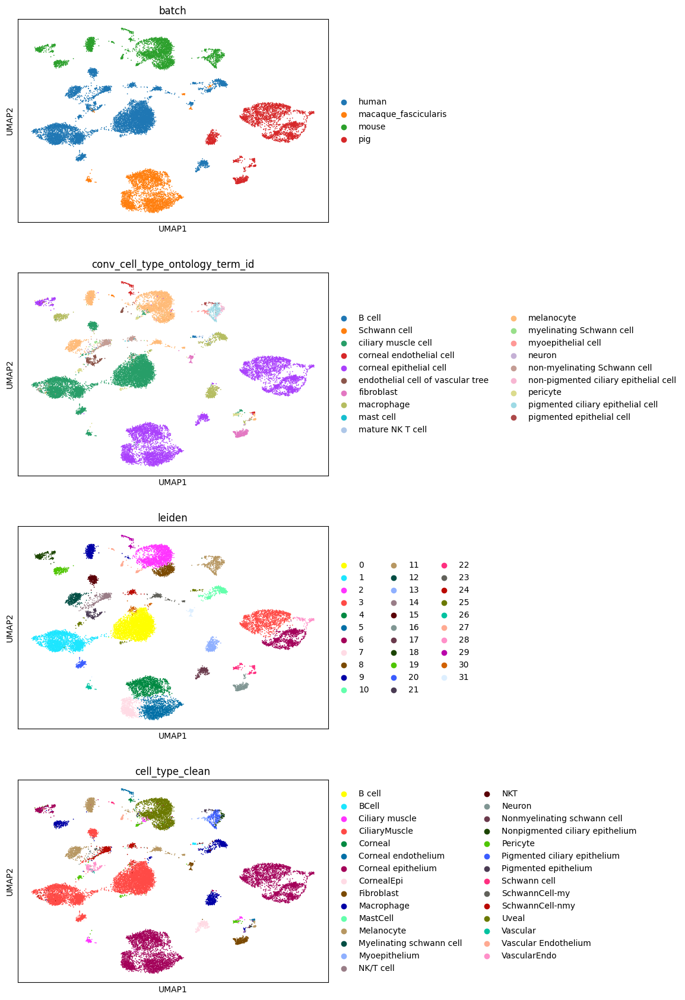

In [44]:
sc.pp.neighbors(n_adata_final, use_rep="X_pca")
sc.tl.umap(n_adata_final)
sc.tl.leiden(n_adata_final)
sc.pl.umap(n_adata_final, color=["batch", "conv_cell_type_ontology_term_id", "leiden", "cell_type_clean"], ncols=1)

## No smoothing


In [45]:
loc = n_adata_final.obs.columns[n_adata_final.obs.columns.str.startswith("CL:")]
pred = n_adata_final.obs.loc[:, loc]

In [46]:
n_adata_final.obs["pred_cell_type_ontology_term_id"] = loc[pred.values.argmax(1)].values
compute_classification(
    n_adata_final,
    ["cell_type_ontology_term_id"],
    label_decoders=model.label_decoders,
    labels_hierarchy=model.labels_hierarchy,
)

{'cell_type_ontology_term_id': {'accuracy': 0.040014569674263714,
  'macro': 0.08665639162502436,
  'micro': 0.040014569674263714,
  'weighted': 0.03257040824473793}}

In [48]:
n_adata_final.obs["conv_pred_cell_type_ontology_term_id"] = translate(
    n_adata_final.obs["pred_cell_type_ontology_term_id"], "cell_type_ontology_term_id"
)
n_adata_final.obs["conv_cell_type_ontology_term_id"] = translate(
    n_adata_final.obs["cell_type_ontology_term_id"], "cell_type_ontology_term_id"
)

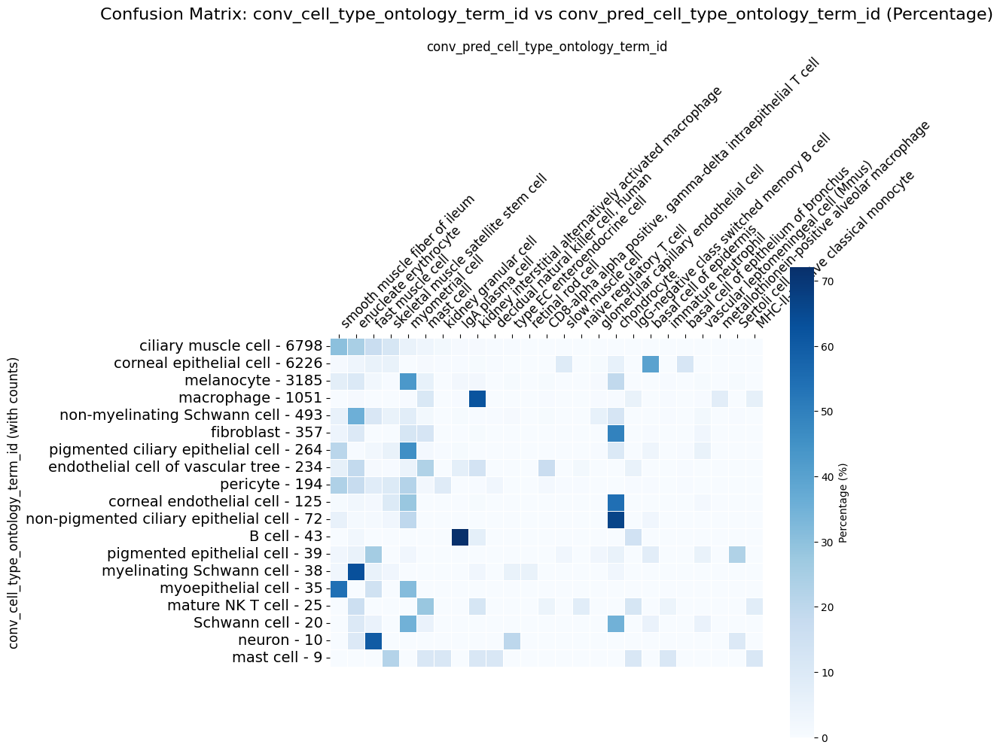

In [49]:
display_confusion_matrix(
    n_adata_final,
    "conv_pred_cell_type_ontology_term_id",
    "conv_cell_type_ontology_term_id",
)

## label smoothing


In [50]:
from scprint2.utils.graph_refinement import zero_shot_annotation_with_refinement

In [51]:
for i in range(3):
    pred.iloc[:, :] = zero_shot_annotation_with_refinement(
        pred.values, n_adata_final, return_raw=True
    ).astype(np.float32)

PairwiseArrays with keys: distances, connectivities


/local/scratch/tmp/ipykernel_1567528/349209925.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[-14.337732 -13.625483 -17.076906 ... -13.747636 -16.015015 -12.256815]' has dtype incompatible with float16, please explicitly cast to a compatible dtype first.
  pred.iloc[:, :] = zero_shot_annotation_with_refinement(
/local/scratch/tmp/ipykernel_1567528/349209925.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[-13.469676 -13.400459 -13.525646 ... -12.231274 -12.458382 -13.068388]' has dtype incompatible with float16, please explicitly cast to a compatible dtype first.
  pred.iloc[:, :] = zero_shot_annotation_with_refinement(
/local/scratch/tmp/ipykernel_1567528/349209925.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[-16.441305 -13.476091 -18.553587 ... -10.28595

PairwiseArrays with keys: distances, connectivities
PairwiseArrays with keys: distances, connectivities


In [52]:
n_adata_final.obs["pred_cell_type_ontology_term_id"] = loc[
    zero_shot_annotation_with_refinement(pred.values, n_adata_final)
].values
compute_classification(
    n_adata_final,
    ["cell_type_ontology_term_id"],
    label_decoders=model.label_decoders,
    labels_hierarchy=model.labels_hierarchy,
)

PairwiseArrays with keys: distances, connectivities


{'cell_type_ontology_term_id': {'accuracy': 0.052815069205952754,
  'macro': 0.05352390180878552,
  'micro': 0.052815069205952754,
  'weighted': 0.05174979623162286}}

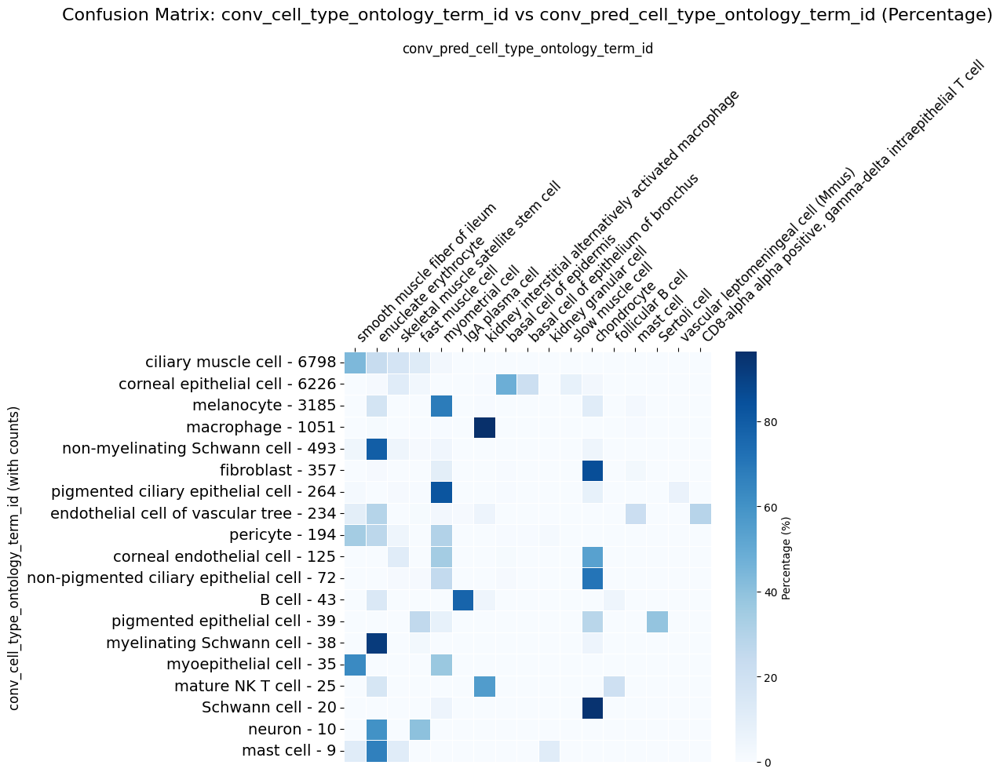

In [53]:
n_adata_final.obs["conv_pred_cell_type_ontology_term_id"] = translate(
    n_adata_final.obs["pred_cell_type_ontology_term_id"], "cell_type_ontology_term_id"
)
n_adata_final.obs["conv_cell_type_ontology_term_id"] = translate(
    n_adata_final.obs["cell_type_ontology_term_id"], "cell_type_ontology_term_id"
)

display_confusion_matrix(
    n_adata_final,
    "conv_pred_cell_type_ontology_term_id",
    "conv_cell_type_ontology_term_id",
)

## hard cluster level aggregation (using scprint embeddings)


In [54]:
sc.tl.leiden(n_adata_final, resolution=4.0)

In [55]:
for i in n_adata_final.obs["leiden"].unique():
    n_adata_final.obs.loc[
        n_adata_final.obs["leiden"] == str(i), "pred_cell_type_ontology_term_id"
    ] = loc[
        n_adata_final.obs.loc[n_adata_final.obs["leiden"] == str(i), loc]
        .values.sum(0)
        .argsort()[::-1][0]
        % len(loc)
    ]

In [56]:
sc.tl.leiden(n_adata_final, resolution=4.0)

In [57]:
compute_classification(
    n_adata_final,
    ["cell_type_ontology_term_id"],
    label_decoders=model.label_decoders,
    labels_hierarchy=model.labels_hierarchy,
)

{'cell_type_ontology_term_id': {'accuracy': 0.05276303465501093,
  'macro': 0.04910411622276029,
  'micro': 0.05276303465501093,
  'weighted': 0.05181764371930371}}

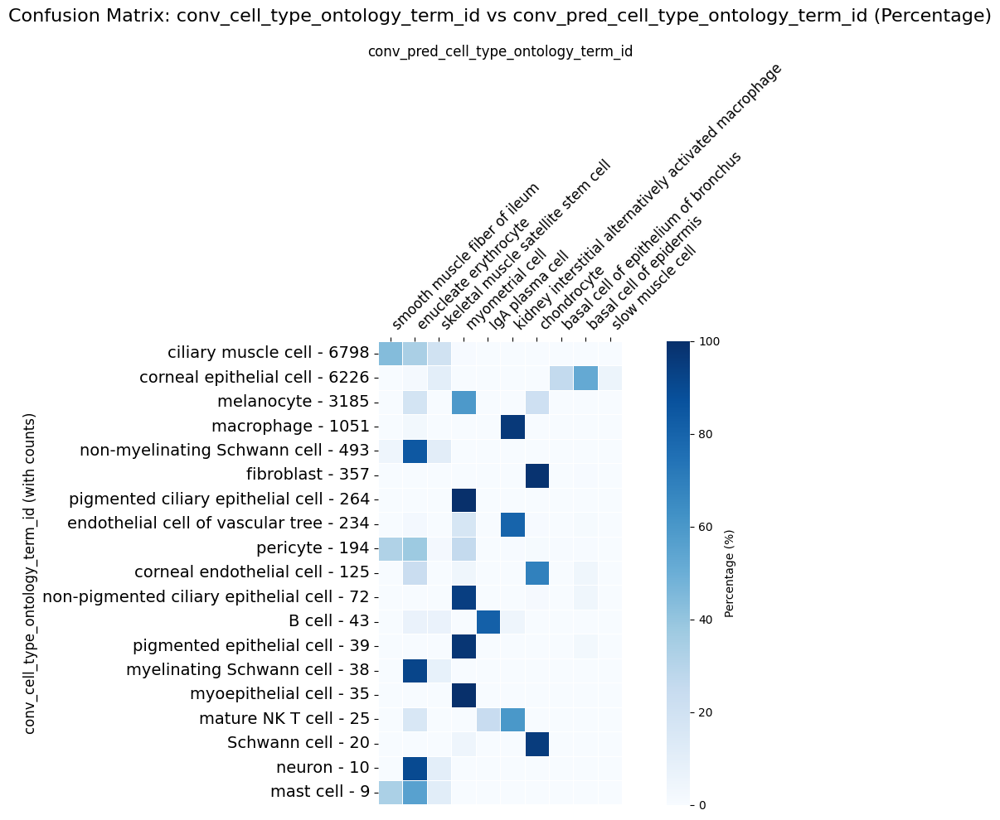

In [58]:
n_adata_final.obs["conv_pred_cell_type_ontology_term_id"] = translate(
    n_adata_final.obs["pred_cell_type_ontology_term_id"], "cell_type_ontology_term_id"
)
n_adata_final.obs["conv_cell_type_ontology_term_id"] = translate(
    n_adata_final.obs["cell_type_ontology_term_id"], "cell_type_ontology_term_id"
)

display_confusion_matrix(
    n_adata_final,
    "conv_pred_cell_type_ontology_term_id",
    "conv_cell_type_ontology_term_id",
)

## Cluster level aggregation using the dataset's computed clusters

(used for annotating cell types)


In [59]:
for i in n_adata_final.obs["cell_type_ontology_term_id"].unique():
    n_adata_final.obs.loc[
        n_adata_final.obs["cell_type_ontology_term_id"] == str(i),
        "pred_cell_type_ontology_term_id",
    ] = loc[
        n_adata_final.obs.loc[n_adata_final.obs["cell_type_ontology_term_id"] == str(i), loc]
        .values.sum(0)
        .argsort()[::-1][0]
        % len(loc)
    ]

/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


In [60]:
compute_classification(
    n_adata_final,
    ["cell_type_ontology_term_id"],
    label_decoders=model.label_decoders,
    labels_hierarchy=model.labels_hierarchy,
)

{'cell_type_ontology_term_id': {'accuracy': 0.054688313039858466,
  'macro': 0.05,
  'micro': 0.054688313039858466,
  'weighted': 0.054688313039858466}}

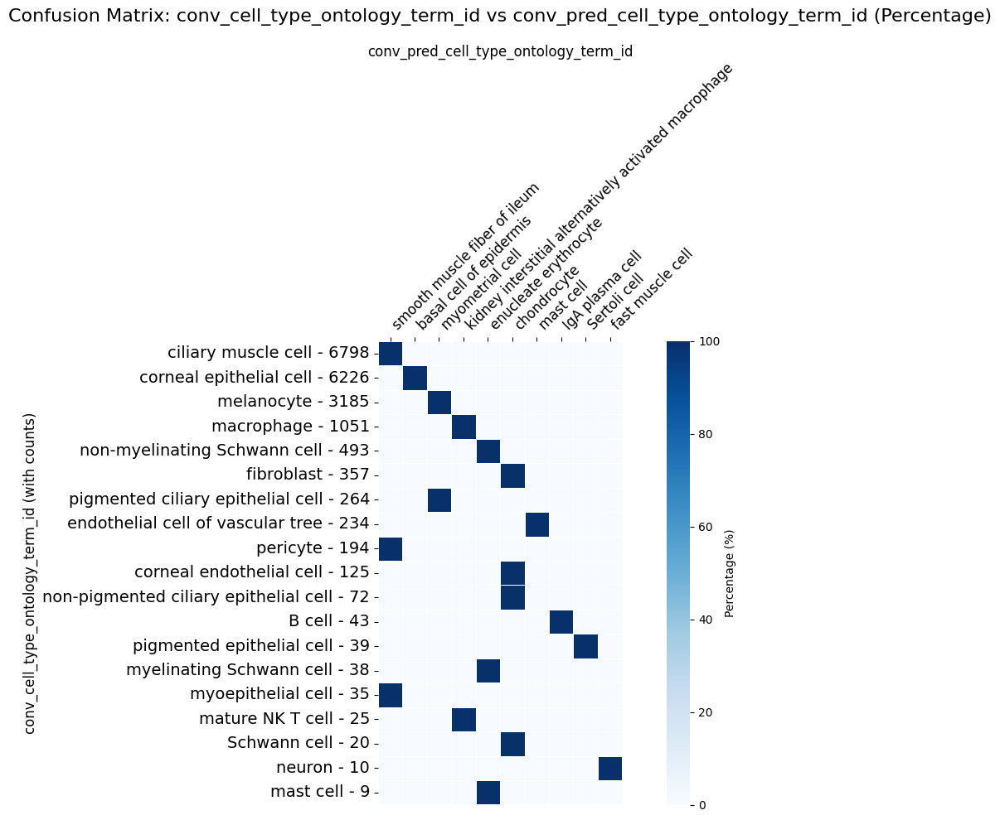

In [61]:
n_adata_final.obs["conv_pred_cell_type_ontology_term_id"] = translate(
    n_adata_final.obs["pred_cell_type_ontology_term_id"], "cell_type_ontology_term_id"
)
n_adata_final.obs["conv_cell_type_ontology_term_id"] = translate(
    n_adata_final.obs["cell_type_ontology_term_id"], "cell_type_ontology_term_id"
)

display_confusion_matrix(
    n_adata_final,
    "conv_pred_cell_type_ontology_term_id",
    "conv_cell_type_ontology_term_id",
)

## function to get coarser labels when the logits are low and similar


In [62]:
names = {
    "cell_type_ontology_term_id": "CL:",
    "disease_ontology_term_id": "MONDO:",
    "assay_ontology_term_id": "EFO:",
    "tissue_ontology_term_id": "UBERON:",  # +PATO:0000461
    "age_group": "HsapDv:",
    "self_reported_ethnicity_ontology_term_id": "HANCESTRO:",
}
CERT = 0.15
topk = 3
out = []
for label, key in names.items():
    ct = n_adata_final.obs.loc[:, n_adata_final.obs.columns.str.startswith(key)]
    res = []
    for j, m in enumerate(np.argsort(ct)[:, ::-1]):
        certainty = ct.iloc[j, m[0]]
        best = model.label_decoders[label][m[0]]
        other = []
        for i in range(1, topk):
            if (ct.iloc[j, m[i]] > certainty - CERT) or (ct.iloc[j, m[i]] > 0):
                other.extend([model.label_decoders[label][m[i]], ct.iloc[j, m[i]]])

            else:
                other.extend([None, 0])
        res.append([best] + [certainty] + other)
    out.append(
        pd.DataFrame(
            res,
            columns=["pred_" + label, "pred_" + label + "_certainty"]
            + sum(
                [
                    [f"pred_{label}_choice_{i}", f"pred_{label}_choice_{i}_certainty"]
                    for i in range(2, topk + 1)
                ],
                [],
            ),
            index=n_adata_final.obs_names,
        )
    )
out = pd.concat(out, axis=1)

decoder = {i: {k: v for k, v in model.label_decoders[i].items()} for i in names.keys()}
hier = {
    i: {
        decoder[i][k]: [decoder[i][u] for u in v]
        for k, v in model.labels_hierarchy[i].items()
    }
    for i in names.keys()
}

## looking at parental relationships
rev_hier = {i: {} for i in names.keys()}
for i, hier in rev_hier.items():
    for k, v in hier.items():
        for u in v:
            if u in rev_hier:
                rev_hier[i][u].append(k)
            else:
                rev_hier[i][u] = [k]

## second step, also setting to unknown if nothing can be resolved


In [63]:
CERT2 = 0.4
new = {i: [] for i in names.keys()}
for idx, row in out.iterrows():
    for i in names.keys():
        # we only have the first one
        if row["pred_" + i + "_choice_2"] is None:
            new[i].append(row["pred_" + i])
            continue
        # we have the third one and want it to at least agree on the most common label
        # if row["pred_" + i + "_choice_3"] is not None:
        #    if (
        #        len(
        #            set(rev_hier[i].get(row["pred_" + i], []))
        #            & set(rev_hier[i].get(row["pred_" + i + "_choice_2"], []))
        #            & set(rev_hier[i].get(row["pred_" + i + "_choice_3"], []))
        #            - set(["CL:0000000"])
        #        )
        #        == 0
        #    ):
        #        new[i].append("unknown")
        #        continue
        # if we have the second one and the third one agrees a bit
        res = set(rev_hier[i].get(row["pred_" + i], [])) & set(
            rev_hier[i].get(row["pred_" + i + "_choice_2"], [])
        ) - set(["CL:0000000"])
        # if the certainty is overall low, we say unknown
        if row["pred_" + i + "_certainty"] < 0:
            new[i].append("unknown")
        # if only one agrees, we take it
        elif len(res) == 0:
            new[i].append(row["pred_" + i])
        # if more than one agrees and we are much more confident for the second than the first, then we select the first
        elif len(res) == 1:
            if (
                row["pred_" + i + "_certainty"]
                > row["pred_" + i + "_choice_2_certainty"] + CERT2
            ):
                new[i].append(row["pred_" + i])
            # else we set it to the parental
            else:
                new[i].append(list(res)[0])
        # if more agrees, we take the most specific, meaning the one with the most parental elements
        else:
            sel = ""
            top = 0
            # this is a debugger line
            import pdb

            pdb.set_trace()
            for elem in res:
                if len(rev_hier[i][elem]) > top:
                    top = len(rev_hier[i][elem])
                    sel = i
            new[i].append(sel)

for i in names.keys():
    n_adata_final.obs["pred_" + i] = new[i]

In [64]:
compute_classification(
    n_adata_final,
    ["cell_type_ontology_term_id"],
    label_decoders=model.label_decoders,
    labels_hierarchy=model.labels_hierarchy,
    use_unknown=False,
)

{'cell_type_ontology_term_id': {'accuracy': 0.045069086164976575,
  'macro': 0.0940098710357331,
  'micro': 0.045069086164976575,
  'weighted': 0.03741288327359239}}

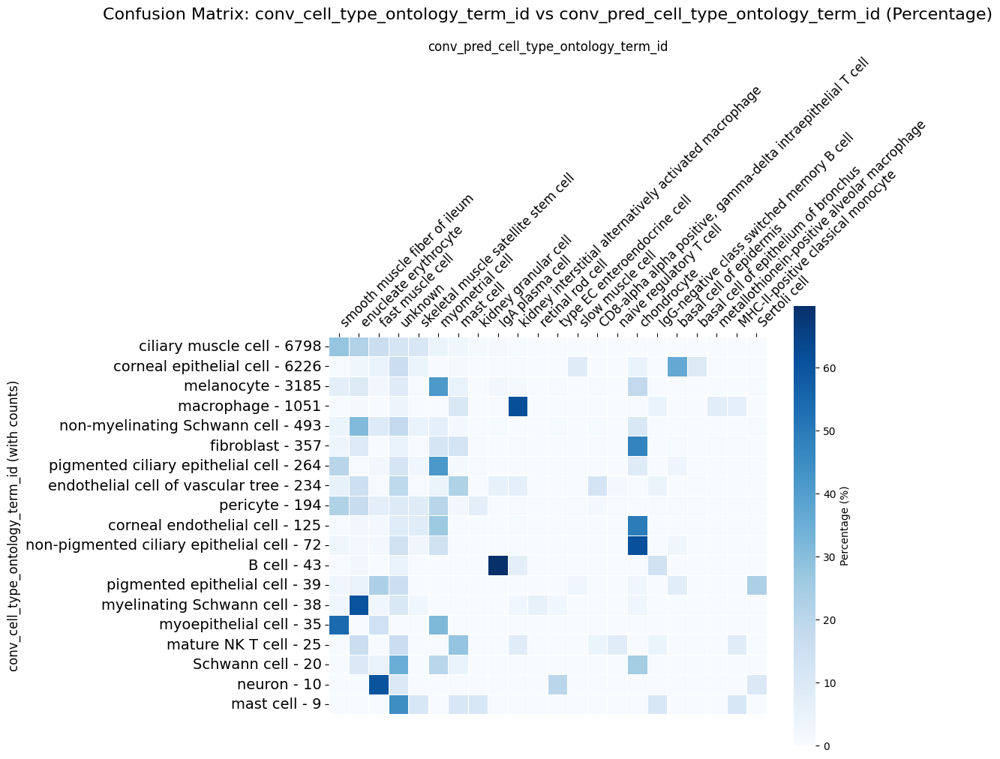

In [65]:
n_adata_final.obs["conv_pred_cell_type_ontology_term_id"] = translate(
    n_adata_final.obs["pred_cell_type_ontology_term_id"], "cell_type_ontology_term_id"
)
n_adata_final.obs["conv_cell_type_ontology_term_id"] = translate(
    n_adata_final.obs["cell_type_ontology_term_id"], "cell_type_ontology_term_id"
)

display_confusion_matrix(
    n_adata_final,
    "conv_pred_cell_type_ontology_term_id",
    "conv_cell_type_ontology_term_id",
)

# Looking at embedding quality


In [66]:
import matplotlib.pyplot as plt

sc.settings.set_figure_params(
    dpi=150,
    fontsize=10,
    frameon=True,
    vector_friendly=True,
)

plt.rcParams["savefig.bbox"] = "tight"
plt.rcParams["savefig.transparent"] = False

In [67]:
n_adata_final.obs["conv_pred_cell_type_ontology_term_id"] = translate(
    n_adata_final.obs["pred_cell_type_ontology_term_id"], "cell_type_ontology_term_id"
)
n_adata_final.obs["conv_cell_type_ontology_term_id"] = translate(
    n_adata_final.obs["cell_type_ontology_term_id"], "cell_type_ontology_term_id"
)

... storing 'conv_cell_type_ontology_term_id' as categorical
... storing 'pred_cell_type_ontology_term_id' as categorical
... storing 'conv_pred_cell_type_ontology_term_id' as categorical
... storing 'pred_disease_ontology_term_id' as categorical
... storing 'pred_assay_ontology_term_id' as categorical
... storing 'pred_tissue_ontology_term_id' as categorical
... storing 'pred_age_group' as categorical
... storing 'pred_self_reported_ethnicity_ontology_term_id' as categorical


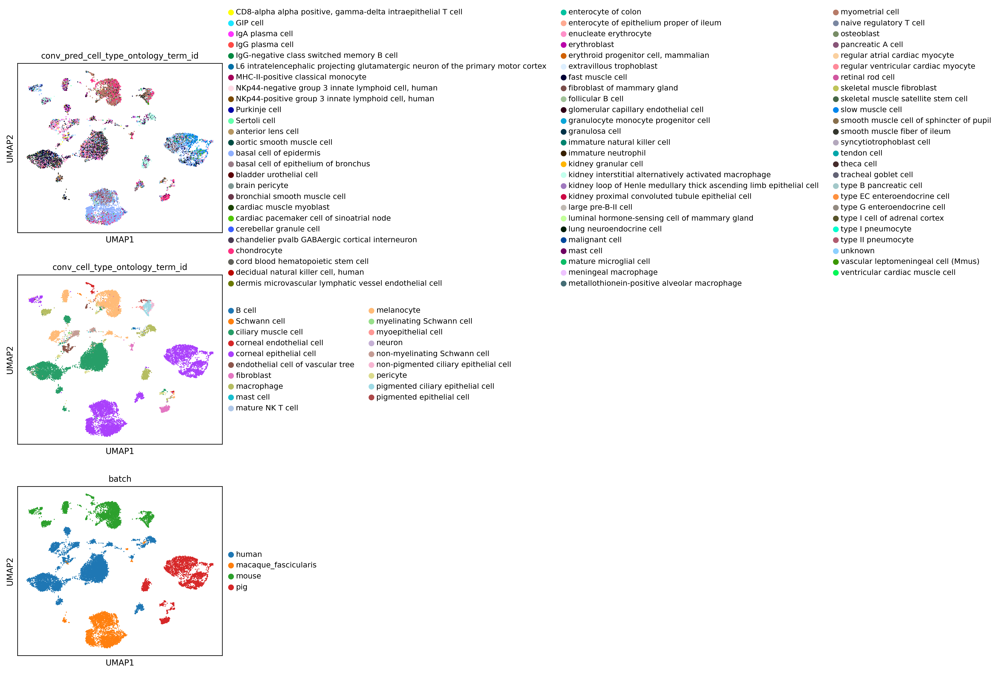

In [68]:
sc.pp.neighbors(n_adata_final, use_rep="X_pca")
sc.tl.umap(n_adata_final)
sc.pl.umap(
    n_adata_final,
    color=[
        "conv_pred_cell_type_ontology_term_id",
        "conv_cell_type_ontology_term_id",
        "batch",
    ],
    ncols=1,
)

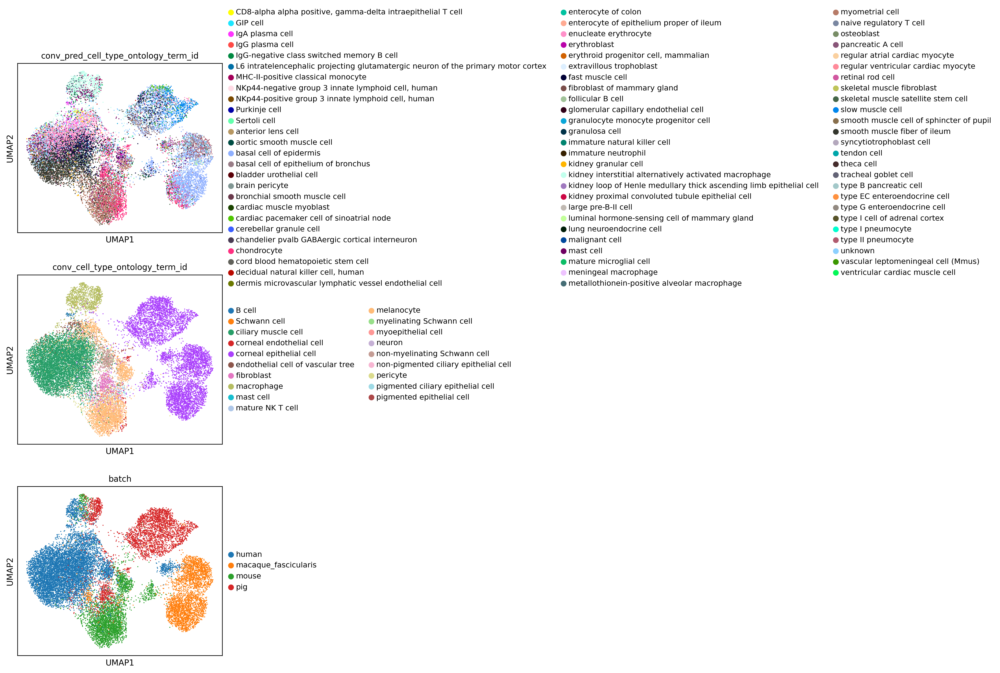

In [69]:
sc.pp.neighbors(n_adata_final, use_rep="scprint_emb_cell_type_ontology_term_id")
sc.tl.umap(n_adata_final)
sc.pl.umap(
    n_adata_final,
    color=[
        "conv_pred_cell_type_ontology_term_id",
        "conv_cell_type_ontology_term_id",
        "batch",
    ],
    ncols=1,
)

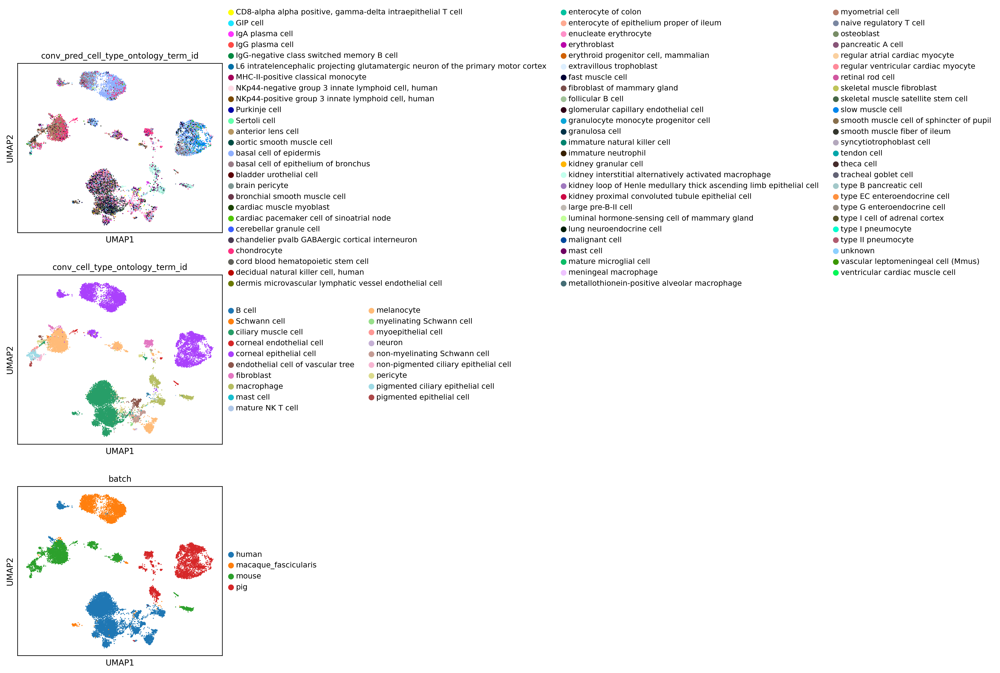

In [70]:
# as above
sc.pp.neighbors(n_adata_final, use_rep="scprint_emb")
sc.tl.umap(n_adata_final)
sc.pl.umap(
    n_adata_final,
    color=[
        "conv_pred_cell_type_ontology_term_id",
        "conv_cell_type_ontology_term_id",
        "batch",
    ],
    ncols=1,
)

##  scIB on batch (species)

In [71]:
n_adata_final

AnnData object with n_obs × n_vars = 19218 × 57066
    obs: 'cell_type', 'batch', 'donor', 'organism_ontology_term_id', 'nnz', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'batches', 'cell_type_clean', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'CL:0000001', 'CL:0000003', 'CL:0000019', 'CL:0000023', 'CL:0000024', 'CL:0000032', 'CL:0000047', 'CL:0000049', 'CL:0000050', 'CL:0000051', 'CL:0000062', 'CL:0000091', 'CL:0000092', 'CL:0000097', 'CL:0000114', 'CL:0000119', 'CL:0000121', 'CL:0000122', 'CL:0000128', 'CL:0000131', 'CL:0000132', 'CL:0000133', 'CL:0000138', 'CL:0000155', 'CL:0000158', 'CL:0000162', 'CL:0000169', 'CL:0000171', 'CL:0000173', 'CL:0000178', 'CL:0000186', 'CL:0000189'

In [72]:
""" # required for other approahces
sc.pp.normalize_total(n_adata, target_sum=1e4)
sc.pp.log1p(n_adata)
sc.pp.pca(n_adata)
sc.pp.neighbors(n_adata, use_rep="X_pca") """

' # required for other approahces\nsc.pp.normalize_total(n_adata, target_sum=1e4)\nsc.pp.log1p(n_adata)\nsc.pp.pca(n_adata)\nsc.pp.neighbors(n_adata, use_rep="X_pca") '

In [73]:
n_adata_final.obsm["random"] = np.random.rand(*n_adata_final.obsm["X_pca"].shape)

In [74]:
n_adata_final.obs["batch"].value_counts()

batch
human                   8809
mouse                   3678
macaque_fascicularis    3400
pig                     3331
Name: count, dtype: int64

In [75]:
bm = Benchmarker(
    n_adata_final,
    batch_key="batch",  # batch, tech, assay_ontology_term_id, donor_id
    label_key="cell_type_clean",  # celltype
    embedding_obsm_keys=[
        "scprint_emb",
        "X_pca",
        "random",
        "scprint_emb_cell_type_ontology_term_id",
    ],
    bio_conservation_metrics=BioConservation(),
    batch_correction_metrics=BatchCorrection(),
    n_jobs=11,
)
bm.benchmark()
bm.get_results(min_max_scale=False)

/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)
Embeddings:   0%|          | 0/4 [00:00<?, ?it/s]Wed Aug 19 14:30:03 2026 INFO isolated labels: no more than 1 batches per label
INFO:2026-08-19 14:30:04,103:jax._src.xla_bridge:927: Unable to initialize backend 'cuda': 
Wed Aug 19 14:30:04 2026 INFO Unable to initialize backend 'cuda': 
INFO:2026-08-19 14:30:04,104:jax._src.xla_bridge:927: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
Wed Aug 19 14:30:04 2026 INFO Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
INFO:2026-08-19 14:30:04,151:jax._src.xla_bridge:927:

INFO     B cell consists of a single batch or is too small. Skip.                                                  
INFO     BCell consists of a single batch or is too small. Skip.                                                   


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CiliaryMuscle consists of a single batch or is too small. Skip.                                           
INFO     Corneal consists of a single batch or is too small. Skip.                                                 


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CornealEpi consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     MastCell consists of a single batch or is too small. Skip.                                                


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     Myelinating schwann cell consists of a single batch or is too small. Skip.                                
INFO     Myoepithelium consists of a single batch or is too small. Skip.                                           
INFO     NK/T cell consists of a single batch or is too small. Skip.                                               
INFO     NKT consists of a single batch or is too small. Skip.                                                     
INFO     Neuron consists of a single batch or is too small. Skip.                                                  
INFO     Nonmyelinating schwann cell consists of a single batch or is too small. Skip.                             
INFO     Nonpigmented ciliary epithelium consists of a single batch or is too small. Skip.                         


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     Pigmented ciliary epithelium consists of a single batch or is too small. Skip.                            
INFO     Pigmented epithelium consists of a single batch or is too small. Skip.                                    
INFO     Schwann cell consists of a single batch or is too small. Skip.                                            
INFO     SchwannCell-my consists of a single batch or is too small. Skip.                                          
INFO     SchwannCell-nmy consists of a single batch or is too small. Skip.                                         
INFO     Uveal consists of a single batch or is too small. Skip.                                                   
INFO     Vascular consists of a single batch or is too small. Skip.                                                
INFO     Vascular Endothelium consists of a single batch or is too small. Skip.                                    
INFO     VascularEndo consists of a single batch or is too small. Skip. 

/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)
Embeddings:  25%|██▌       | 1/4 [05:26<16:18, 326.18s/it]Wed Aug 19 14:35:30 2026 INFO isolated labels: no more than 1 batches per label


INFO     B cell consists of a single batch or is too small. Skip.                                                  
INFO     BCell consists of a single batch or is too small. Skip.                                                   


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CiliaryMuscle consists of a single batch or is too small. Skip.                                           
INFO     Corneal consists of a single batch or is too small. Skip.                                                 


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CornealEpi consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     MastCell consists of a single batch or is too small. Skip.                                                


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     Myelinating schwann cell consists of a single batch or is too small. Skip.                                
INFO     Myoepithelium consists of a single batch or is too small. Skip.                                           
INFO     NK/T cell consists of a single batch or is too small. Skip.                                               
INFO     NKT consists of a single batch or is too small. Skip.                                                     
INFO     Neuron consists of a single batch or is too small. Skip.                                                  
INFO     Nonmyelinating schwann cell consists of a single batch or is too small. Skip.                             
INFO     Nonpigmented ciliary epithelium consists of a single batch or is too small. Skip.                         


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     Pigmented ciliary epithelium consists of a single batch or is too small. Skip.                            
INFO     Pigmented epithelium consists of a single batch or is too small. Skip.                                    
INFO     Schwann cell consists of a single batch or is too small. Skip.                                            
INFO     SchwannCell-my consists of a single batch or is too small. Skip.                                          
INFO     SchwannCell-nmy consists of a single batch or is too small. Skip.                                         
INFO     Uveal consists of a single batch or is too small. Skip.                                                   
INFO     Vascular consists of a single batch or is too small. Skip.                                                
INFO     Vascular Endothelium consists of a single batch or is too small. Skip.                                    
INFO     VascularEndo consists of a single batch or is too small. Skip. 

/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)
Embeddings:  50%|█████     | 2/4 [06:03<05:12, 156.30s/it]Wed Aug 19 14:36:07 2026 INFO isolated labels: no more than 1 batches per label


INFO     B cell consists of a single batch or is too small. Skip.                                                  
INFO     BCell consists of a single batch or is too small. Skip.                                                   
INFO     CiliaryMuscle consists of a single batch or is too small. Skip.                                           
INFO     Corneal consists of a single batch or is too small. Skip.                                                 


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CornealEpi consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     MastCell consists of a single batch or is too small. Skip.                                                


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     Myelinating schwann cell consists of a single batch or is too small. Skip.                                
INFO     Myoepithelium consists of a single batch or is too small. Skip.                                           
INFO     NK/T cell consists of a single batch or is too small. Skip.                                               
INFO     NKT consists of a single batch or is too small. Skip.                                                     
INFO     Neuron consists of a single batch or is too small. Skip.                                                  
INFO     Nonmyelinating schwann cell consists of a single batch or is too small. Skip.                             
INFO     Nonpigmented ciliary epithelium consists of a single batch or is too small. Skip.                         
INFO     Pigmented ciliary epithelium consists of a single batch or is too small. Skip.                            
INFO     Pigmented epithelium consists of a single batch or is too small

/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)
Embeddings:  75%|███████▌  | 3/4 [06:42<01:42, 102.53s/it]Wed Aug 19 14:36:45 2026 INFO isolated labels: no more than 1 batches per label


INFO     B cell consists of a single batch or is too small. Skip.                                                  
INFO     BCell consists of a single batch or is too small. Skip.                                                   


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CiliaryMuscle consists of a single batch or is too small. Skip.                                           
INFO     Corneal consists of a single batch or is too small. Skip.                                                 


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CornealEpi consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     MastCell consists of a single batch or is too small. Skip.                                                


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     Myelinating schwann cell consists of a single batch or is too small. Skip.                                
INFO     Myoepithelium consists of a single batch or is too small. Skip.                                           
INFO     NK/T cell consists of a single batch or is too small. Skip.                                               
INFO     NKT consists of a single batch or is too small. Skip.                                                     
INFO     Neuron consists of a single batch or is too small. Skip.                                                  
INFO     Nonmyelinating schwann cell consists of a single batch or is too small. Skip.                             
INFO     Nonpigmented ciliary epithelium consists of a single batch or is too small. Skip.                         


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     Pigmented ciliary epithelium consists of a single batch or is too small. Skip.                            
INFO     Pigmented epithelium consists of a single batch or is too small. Skip.                                    
INFO     Schwann cell consists of a single batch or is too small. Skip.                                            
INFO     SchwannCell-my consists of a single batch or is too small. Skip.                                          
INFO     SchwannCell-nmy consists of a single batch or is too small. Skip.                                         
INFO     Uveal consists of a single batch or is too small. Skip.                                                   
INFO     Vascular consists of a single batch or is too small. Skip.                                                
INFO     Vascular Endothelium consists of a single batch or is too small. Skip.                                    
INFO     VascularEndo consists of a single batch or is too small. Skip. 

/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)
Embeddings: 100%|██████████| 4/4 [07:18<00:00, 109.64s/it]


,Isolated labels,KMeans NMI,KMeans ARI,Silhouette label,cLISI,Silhouette batch,iLISI,KBET,Graph connectivity,PCR comparison,Batch correction,Bio conservation,Total
Embedding,,,,,,,,,,,,,
scprint_emb,0.550775,0.633628,0.267766,0.552716,1.0,0.814499,0.0,0.0,0.692243,0,0.301348,0.600977,0.481125
X_pca,0.471432,0.47877,0.272861,0.44313,1.0,0.77051,0.0,0.009176,0.769718,0.0,0.309881,0.533239,0.443896
random,0.467201,0.008076,-0.000034,0.466602,0.915134,0.986104,0.633287,0.414435,0.139864,0.999352,0.634608,0.371396,0.476681
scprint_emb_cell_type_ontology_term_id,0.522474,0.523272,0.214308,0.510085,0.999627,0.793525,0.0,0.113693,0.589049,0,0.299254,0.553953,0.452073
Metric Type,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Batch correction,Batch correction,Batch correction,Batch correction,Batch correction,Aggregate score,Aggregate score,Aggregate score


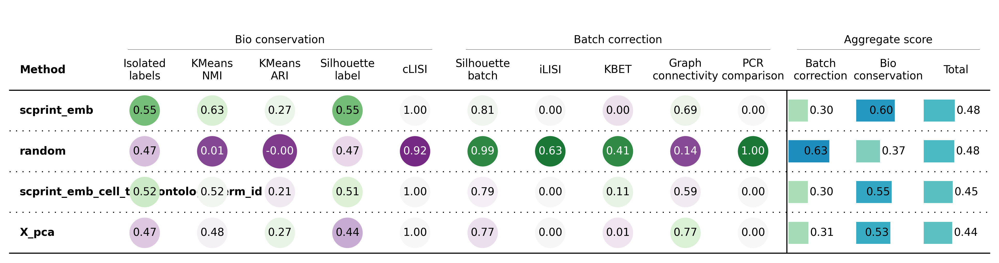

In [76]:
# cell_type embedding latest
bm.plot_results_table(min_max_scale=False)

In [79]:
# most expr and w..
bm = Benchmarker(
    n_adata_final,
    batch_key="batch",  # batch, tech, assay_ontology_term_id, donor_id
    label_key="cell_type_ontology_term_id",  # celltype
    embedding_obsm_keys=[
        "scprint_emb",
        "X_pca",
        "random",
        "scprint_emb_cell_type_ontology_term_id",
    ],
    bio_conservation_metrics=BioConservation(),
    batch_correction_metrics=BatchCorrection(),
    n_jobs=10,
)
bm.benchmark()
bm.get_results(min_max_scale=False)

/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)
Embeddings:   0%|          | 0/4 [00:00<?, ?it/s]Wed Aug 19 15:07:16 2026 INFO isolated labels: no more than 1 batches per label


INFO     CL:0000097 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000185 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000529 consists of a single batch or is too small. Skip.                                              
INFO     CL:0000540 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0002303 consists of a single batch or is too small. Skip.                                              
INFO     CL:0002304 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0002573 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)
Embeddings:  25%|██▌       | 1/4 [07:06<21:18, 426.15s/it]Wed Aug 19 15:14:22 2026 INFO isolated labels: no more than 1 batches per label
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000097 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000185 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000529 consists of a single batch or is too small. Skip.                                              
INFO     CL:0000540 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Seri

INFO     CL:0002303 consists of a single batch or is too small. Skip.                                              
INFO     CL:0002304 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0002573 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)
Embeddings:  50%|█████     | 2/4 [07:46<06:38, 199.14s/it]Wed Aug 19 15:15:02 2026 INFO isolated labels: no more than 1 batches per label


INFO     CL:0000097 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000185 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000529 consists of a single batch or is too small. Skip.                                              
INFO     CL:0000540 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0002303 consists of a single batch or is too small. Skip.                                              
INFO     CL:0002304 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0002573 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)
Embeddings:  75%|███████▌  | 3/4 [08:26<02:06, 126.55s/it]Wed Aug 19 15:15:42 2026 INFO isolated labels: no more than 1 batches per label
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000097 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000185 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000529 consists of a single batch or is too small. Skip.                                              
INFO     CL:0000540 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0002303 consists of a single batch or is too small. Skip.                                              
INFO     CL:0002304 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0002573 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)
Embeddings: 100%|██████████| 4/4 [09:02<00:00, 135.66s/it]


,Isolated labels,KMeans NMI,KMeans ARI,Silhouette label,cLISI,Silhouette batch,iLISI,KBET,Graph connectivity,PCR comparison,Batch correction,Bio conservation,Total
Embedding,,,,,,,,,,,,,
scprint_emb,0.555467,0.59441,0.300316,0.555707,1.0,0.821523,0.0,0.302527,0.642325,0,0.353275,0.60118,0.502018
X_pca,0.486255,0.457807,0.238246,0.442883,1.0,0.761643,0.0,0.309131,0.762288,0.0,0.366612,0.525038,0.461668
random,0.488023,0.003945,-0.000008,0.487225,0.883026,0.978217,0.633232,0.401229,0.138077,0.999352,0.630021,0.372442,0.475474
scprint_emb_cell_type_ontology_term_id,0.534934,0.483439,0.232248,0.507956,0.99958,0.803257,0.0,0.370488,0.57755,0,0.350259,0.551631,0.471082
Metric Type,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Batch correction,Batch correction,Batch correction,Batch correction,Batch correction,Aggregate score,Aggregate score,Aggregate score


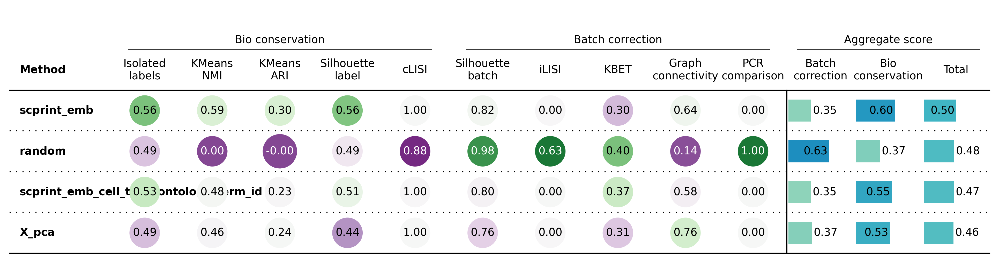

In [80]:
# cell_type embedding latest
bm.plot_results_table(min_max_scale=False)

In [81]:
# most expr and w..
bm = Benchmarker(
    n_adata_final,
    batch_key="batch",  # batch, tech, assay_ontology_term_id, donor_id
    label_key="cell_type_ontology_term_id",  # celltype
    embedding_obsm_keys=[
        "scprint_emb",
        "X_pca",
        "random",
        "scprint_emb_cell_type_ontology_term_id",
    ],
    bio_conservation_metrics=BioConservation(),
    batch_correction_metrics=BatchCorrection(),
    n_jobs=10,
)
bm.benchmark()
bm.get_results(min_max_scale=False)

/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)
Embeddings:   0%|          | 0/4 [00:00<?, ?it/s]Wed Aug 19 15:16:55 2026 INFO isolated labels: no more than 1 batches per label


INFO     CL:0000097 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000185 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000529 consists of a single batch or is too small. Skip.                                              
INFO     CL:0000540 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0002303 consists of a single batch or is too small. Skip.                                              
INFO     CL:0002304 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0002573 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)
Embeddings:  25%|██▌       | 1/4 [03:51<11:34, 231.38s/it]Wed Aug 19 15:20:46 2026 INFO isolated labels: no more than 1 batches per label


INFO     CL:0000097 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000185 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000529 consists of a single batch or is too small. Skip.                                              
INFO     CL:0000540 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0002303 consists of a single batch or is too small. Skip.                                              
INFO     CL:0002304 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0002573 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)
Embeddings:  50%|█████     | 2/4 [04:30<03:56, 118.37s/it]Wed Aug 19 15:21:26 2026 INFO isolated labels: no more than 1 batches per label


INFO     CL:0000097 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000185 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000529 consists of a single batch or is too small. Skip.                                              
INFO     CL:0000540 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0002303 consists of a single batch or is too small. Skip.                                              
INFO     CL:0002304 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0002573 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)
Embeddings:  75%|███████▌  | 3/4 [05:10<01:22, 82.34s/it] Wed Aug 19 15:22:05 2026 INFO isolated labels: no more than 1 batches per label


INFO     CL:0000097 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000185 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0000529 consists of a single batch or is too small. Skip.                                              
INFO     CL:0000540 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Seri

INFO     CL:0002303 consists of a single batch or is too small. Skip.                                              
INFO     CL:0002304 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)


INFO     CL:0002573 consists of a single batch or is too small. Skip.                                              


/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/pasteur/appa/homes/jkalfon/scPRINT/.venv/lib/python3.11/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)
Embeddings: 100%|██████████| 4/4 [05:43<00:00, 85.80s/it]


,Isolated labels,KMeans NMI,KMeans ARI,Silhouette label,cLISI,Silhouette batch,iLISI,KBET,Graph connectivity,PCR comparison,Batch correction,Bio conservation,Total
Embedding,,,,,,,,,,,,,
scprint_emb,0.555467,0.59441,0.300316,0.555707,1.0,0.821523,0.0,0.302527,0.642325,0,0.353275,0.60118,0.502018
X_pca,0.486255,0.457807,0.238246,0.442883,1.0,0.761643,0.0,0.309131,0.762288,0.0,0.366612,0.525038,0.461668
random,0.488023,0.003945,-0.000008,0.487225,0.883026,0.978217,0.633232,0.401229,0.138077,0.999352,0.630021,0.372442,0.475474
scprint_emb_cell_type_ontology_term_id,0.534934,0.483439,0.232248,0.507956,0.99958,0.803257,0.0,0.370488,0.57755,0,0.350259,0.551631,0.471082
Metric Type,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Batch correction,Batch correction,Batch correction,Batch correction,Batch correction,Aggregate score,Aggregate score,Aggregate score


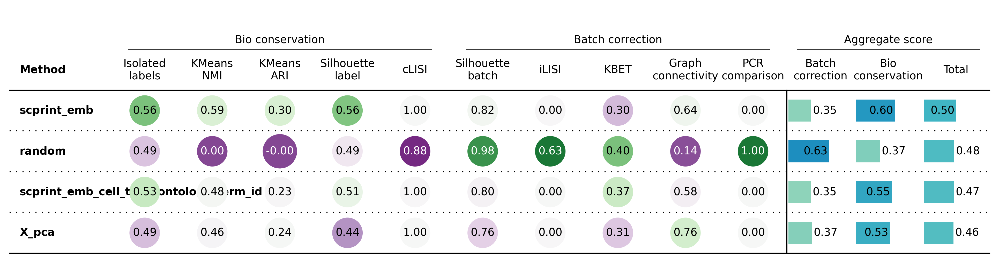

In [82]:
# cell_type embedding latest
bm.plot_results_table(min_max_scale=False)

In [83]:
n_adata_final.shape

(19218, 57066)